# 🤖 **Model Benchmark — BTC Target + ETH Cross-Asset Features**

### 🎯 **Objective**
Evaluate whether adding **ETH market features** as cross-asset signals improves **BTC crash prediction** compared to the market-only baseline (`01_model_benchmark_btc.ipynb`).

### ⚠️ **Problem Definition**
Binary classification task on **BTC crashes**:

- `True` → BTC Crash (>10% drop within 7 days)
- `False` → No crash

The dataset is **highly imbalanced** (~2% crashes).

### 🔬 **Benchmark Focus**
Test whether **ETH market dynamics** carry predictive information for BTC crash prediction. The cross-asset hypothesis: ETH and BTC markets are correlated — ETH market stress may anticipate BTC crashes (or vice versa).

### 📊 **Feature Set**

| Source | Count |
|---|---|
| BTC market features (notebook 01 EDA) | 17 |
| ETH cross-features — engineered only (notebook 06 EDA, no raw OHLCV) | 17 |
| **Total** | **34** |

17 engineered ETH features selected (returns, volatility, momentum, pressure, drawdown, MA ratio — mirroring the BTC feature set). Raw OHLCV (open, high, low, close, volume) and absolute MAs excluded: non-stationary levels add spurious correlation, not crash dynamics.

### 🚀 **Goal**
Determine whether ETH market data adds signal for BTC crash prediction and compare against the 17-feature market-only baseline.

In [1]:
import pandas as pd
from pipelines.ml_benchmark import run_benchmark_pipeline

/home/pierre/Documents/Documents/crypto/crypto-prediction/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### **1. Load BTC and ETH Price Data**

In [2]:
df_btc = pd.read_csv("../../data/gold/market/btc_usdt_1d_features.csv")
df_eth = pd.read_csv("../../data/gold/market/eth_usdt_1d_features.csv")

print(f"BTC price : {df_btc.shape[0]} rows, {df_btc.shape[1]} columns")
print(f"ETH price : {df_eth.shape[0]} rows, {df_eth.shape[1]} columns")

BTC price : 3115 rows, 30 columns
ETH price : 3114 rows, 30 columns


SELECTED_FEATURES = [
    # BTC market features (17)
    "return_1d", "return_7d",
    "volatility_7d", "volatility_30d",
    "buy_pressure",
    "drawdown",
    "ma_ratio",
    "lag_return_1d", "lag_return_7d",
    "lag_volatility_7d",
    "lag_buy_pressure",
    "lag_volume_norm",
    "momentum_acc",
    "momentum_volatility",
    "volume",
    "number_of_trades",
    "quote_asset_volume",

    # ETH cross-features — engineered only (17, mirrors BTC feature categories)
    # Raw OHLCV (high/open/low/close/volume) and absolute MAs (ma_7/ma_30) excluded
    "momentum_volatility_eth", "return_7d_eth", "lag_return_7d_eth",
    "volatility_30d_eth", "volatility_7d_eth", "lag_volatility_7d_eth",
    "lag_volume_norm_eth", "pressure_x_return_eth", "volume_norm_eth",
    "return_1d_eth", "lag_return_1d_eth", "drawdown_eth",
    "ma_ratio_eth", "volatility_ratio_eth",
    "buy_pressure_eth", "lag_buy_pressure_eth", "momentum_acc_eth",
]

TARGET = "target"

df = df[SELECTED_FEATURES + [TARGET]]

print(f"Dataset shape : {df.shape}")
print(f"Target distribution:\n{df[TARGET].value_counts()}")
df.isna().sum().loc[lambda s: s > 0]

In [3]:
df_btc["open_time"] = pd.to_datetime(df_btc["open_time"], errors="coerce")
df_eth["open_time"] = pd.to_datetime(df_eth["open_time"], errors="coerce")

eth_renamed = df_eth.rename(columns={c: f"{c}_eth" for c in df_eth.columns if c != "open_time"})

df = pd.merge(df_btc, eth_renamed, on="open_time", how="inner")
df.drop(columns=["target_eth", "open_time"], inplace=True)

print(f"Merged dataset : {df.shape[0]} rows, {df.shape[1]} columns")
df.head()

Merged dataset : 3114 rows, 57 columns


,open,high,low,close,volume,quote_asset_volume,number_of_trades,taker_buy_base_volume,taker_buy_quote_volume,return_1d,...,lag_volatility_7d_eth,lag_volume_norm_eth,lag_buy_pressure_eth,momentum_acc_eth,volatility_ratio_eth,momentum_volatility_eth,pressure_x_return_eth,ma_7_eth,ma_30_eth,ma_ratio_eth
0,3674.01,3950.00,3470.66,3714.95,1297.563953,4.804878e+06,8809,624.887842,2.314536e+06,0.004041,...,0.116960,2.382383,0.418015,-0.190181,1.514538,-0.018696,-0.005442,268.455714,315.714667,0.850311
1,3685.23,3748.21,3499.02,3699.99,682.171210,2.466490e+06,6355,273.931976,9.948436e+05,-0.004027,...,0.116971,1.703868,0.373150,0.047636,1.532832,-0.014528,0.010328,263.320000,314.501000,0.837263
2,3690.00,4123.20,3690.00,4035.01,1030.006455,4.069033e+06,8220,417.638722,1.651863e+06,0.090546,...,0.118611,0.779827,0.312492,0.110688,1.623058,-0.001218,0.081614,262.930000,314.623000,0.835699
3,4060.00,4089.97,3830.91,3910.04,902.332129,3.558315e+06,7342,257.320352,1.016804e+06,-0.030971,...,0.132689,0.689572,0.567790,-0.179622,1.630211,-0.004525,-0.015157,261.507143,314.119667,0.832508
4,3910.04,4046.08,3820.00,3900.00,720.935076,2.839584e+06,7231,395.275138,1.562210e+06,-0.002568,...,0.133563,0.313636,0.422389,0.028841,1.626730,0.002409,-0.003763,262.234286,312.743333,0.838497


### **3. Feature Selection**

- **17 BTC market features** — identical to `01_model_benchmark_btc.ipynb`
- **28 ETH cross-features** — selected in `06_eda_btc_with_eth.ipynb`:
  - Combined score (|Spearman| + MI, normalized) ≥ 0.10
  - Redundancy filter: max |corr| with BTC features < 0.9
  - **Result: all 28 ETH features passed both filters** — no ETH feature was redundant with BTC features

In [4]:
SELECTED_FEATURES = [
    # BTC market features (17)
    "return_1d", "return_7d",
    "volatility_7d", "volatility_30d",
    "buy_pressure",
    "drawdown",
    "ma_ratio",
    "lag_return_1d", "lag_return_7d",
    "lag_volatility_7d",
    "lag_buy_pressure",
    "lag_volume_norm",
    "momentum_acc",
    "momentum_volatility",
    "volume",
    "number_of_trades",
    "quote_asset_volume",

    # ETH cross-features — engineered only (17, mirrors BTC feature categories)
    # Raw OHLCV (high/open/low/close/volume) and absolute MAs (ma_7/ma_30) excluded
    "momentum_volatility_eth", "return_7d_eth", "lag_return_7d_eth",
    "volatility_30d_eth", "volatility_7d_eth", "lag_volatility_7d_eth",
    "lag_volume_norm_eth", "pressure_x_return_eth", "volume_norm_eth",
    "return_1d_eth", "lag_return_1d_eth", "drawdown_eth",
    "ma_ratio_eth", "volatility_ratio_eth",
    "buy_pressure_eth", "lag_buy_pressure_eth", "momentum_acc_eth",
]

TARGET = "target"

df = df[SELECTED_FEATURES + [TARGET]]

print(f"Dataset shape : {df.shape}")
print(f"Target distribution:\n{df[TARGET].value_counts()}")
df.isna().sum().loc[lambda s: s > 0]

Dataset shape : (3114, 35)
Target distribution:
target
0    2734
1     380
Name: count, dtype: int64


Series([], dtype: int64)

### **4. Model Benchmark**


=== Confusion matrix (OOF, global) — dummy ===


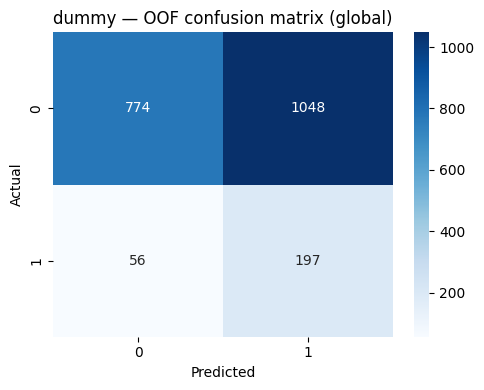


=== Confusion matrix (OOF, global) — logistic ===


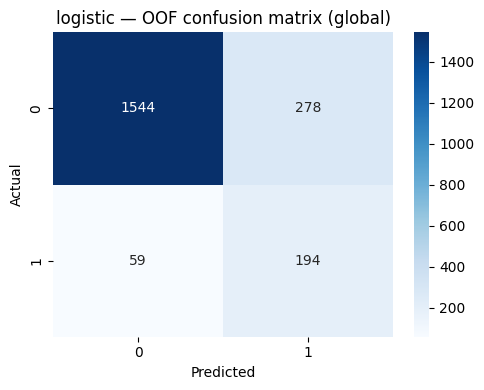


=== Confusion matrix (OOF, global) — random_forest ===


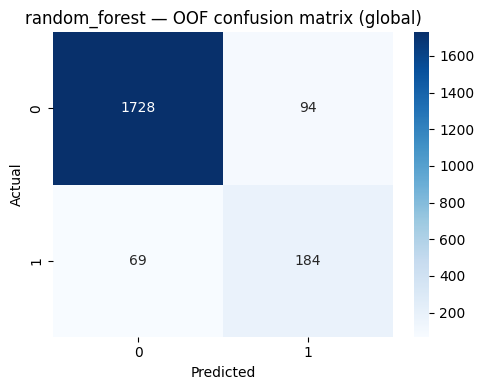


=== Confusion matrix (OOF, global) — xgboost ===


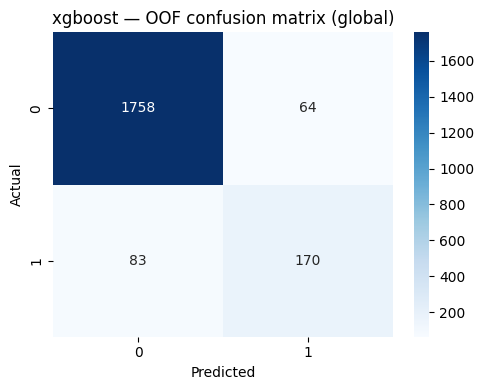

[LightGBM] [Info] Number of positive: 105, number of negative: 311
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000648 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4710
[LightGBM] [Info] Number of data points in the train set: 416, number of used features: 34
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.252404 -> initscore=-1.085833
[LightGBM] [Info] Start training from score -1.085833
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, bes

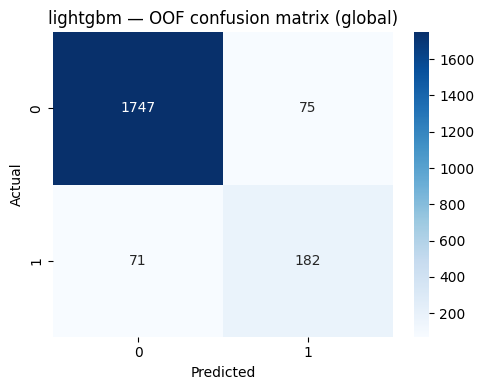


=== Confusion matrix (OOF, global) — catboost ===


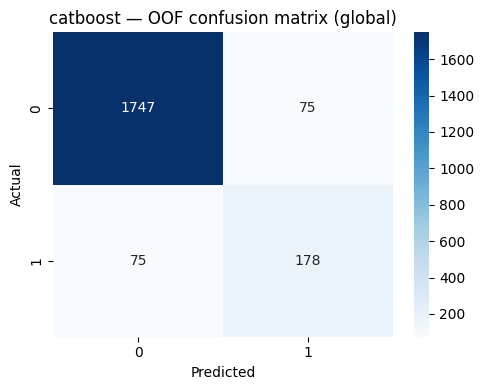

,precision,recall,f1,TP,FP,FN,TN,pr_auc
catboost,0.703557,0.703557,0.703557,178.000000,75.000000,75.000000,1747.000000,0.765694
lightgbm,0.708171,0.719368,0.713725,182.000000,75.000000,71.000000,1747.000000,0.764449
xgboost,0.726496,0.671937,0.698152,170.000000,64.000000,83.000000,1758.000000,0.762265
random_forest,0.661871,0.727273,0.693032,184.000000,94.000000,69.000000,1728.000000,0.734620
logistic,0.411017,0.766798,0.535172,194.000000,278.000000,59.000000,1544.000000,0.615219
dummy,0.158233,0.778656,0.263017,197.000000,1048.000000,56.000000,774.000000,0.148498
mean,0.561557,0.727931,0.601109,184.166667,272.333333,68.833333,1549.666667,0.631791
std,0.209865,0.036256,0.163146,9.172725,354.677631,9.172725,354.677631,0.222475


In [5]:
results = run_benchmark_pipeline(df, verbose=False, plot_confusion=True)

results_df = pd.DataFrame(results).T
results_df = results_df.sort_values("pr_auc", ascending=False)

# Summary rows
results_df.loc["mean"] = results_df.select_dtypes("number").mean()
results_df.loc["std"]  = results_df.select_dtypes("number").std()

results_df